In this notebook we are going to analyze and resynthesize a short excerpt from Bayle's L’Aventure du cri (1969) -  l'inconscient de la forme.

1. Let's import the audio file:

In [9]:
from audiospylt.audio_utils import load_audio_sample_and_preview

audio_opts = dict(
    wav_source='../samples/bayle.wav',
    desired_sample_rate=None,
    convert_to_mono=True,
    download_mode='temp',
    download_dir=None,
    show_load_bar=True,
    show_properties=True,
    show_waveform=True,
    play_audio=True,
    playback_fs_target_name='source',
    playback_bit_rate=24,
    playback_save_audio=False,
    playback_sanitize=True,
    source_verbose=True,
    playback_verbose=False,
    plot_width=1000,
    plot_height=600,
    plot_title_source='source',
    plot_title_mode='full',
)

audio_data, sample_rate, audio_info = load_audio_sample_and_preview(**audio_opts)


WAV file loaded from local path: c:\Users\egorp\Nextcloud\code\public_repos\audiospylt\samples\bayle.wav
Number of audio channels: 1
Sampling rate: 44100 Hz
WAV file loaded from ../samples/bayle.wav
Total duration: 7.689 seconds


2. Now, let's select the snippet we are interested in. Let's also add a small fade-in/fade-out to prevent clipping. Fell free to play with fade in/out exponents a bit.

In [5]:
from audiospylt.audio_utils import trim_and_fade_and_render

start_time = 1.6
end_time = 2.7
add_fades = True
fade_in_duration = 0.05
fade_out_duration = 0.05
fade_in_exponent = 1
fade_out_exponent = 1

cut_opts = dict(
    start_time=start_time,
    end_time=end_time,
    add_fades=add_fades,
    fade_in_duration=fade_in_duration,
    fade_out_duration=fade_out_duration,
    fade_in_exponent=fade_in_exponent,
    fade_out_exponent=fade_out_exponent,
    plot_width=1000,
    plot_height=None,
    plot_title_source='source',
    plot_title_mode='full',
    cut_sanitize=True,
    cut_verbose=True,
    render=True,
    fs_target_name='source',
    bit_rate=24,
    save_audio=False,
    player=True,
    sanitize=True,
    verbose=True,
)

cut_audio_data, cut_duration, cut_render_result = trim_and_fade_and_render(
    audio_data=audio_data,
    sample_rate=sample_rate,
    audio_info=audio_info,
    **cut_opts,
)

3. We can also display the spectrogram to inspect the spectral properties of the analyzed snippet.

In [8]:
from audiospylt.audio_utils import plot_spectrogram_with_waveform

spec_opts = dict(
    audio_info=audio_info,

    # Axis scaling:
    y_axis_mode="mel",
    y_axis_mix=0.5,
    mixed_log_floor_hz=1.0,
    amp_scale="db",
    power_law_gamma=0.1,

    # STFT params:
    n_fft=2048,
    window_type="hann",
    overlap=0.5,
    oversample_factor=2.0,

    # Edge framing / time base:
    boundary="zeros_end",
    padded=True,
    time_reference="start",
    time_range="signal",

    # Optional synchronous waveform:
    waveform_mode="integrated",
    waveform_height_ratio=0.25,
    waveform_line_width=1.0,
    waveform_max_points="sample_rate",

    # Mel-only params:
    mel_bins=128,
    mel_fmax=sample_rate / 2,

    # Scaling/appearance:
    scaling="density",
    mode="magnitude",
    cmap="Magma",
    show=True,
    print_info=True,

    # Plot size / title naming:
    plot_width=1000,
    plot_height=None,
    plot_title_source="source",
    plot_title_mode="full",
)

fig, spec_info = plot_spectrogram_with_waveform(cut_audio_data, sample_rate, **spec_opts)

Spectrogram settings:
- sample_rate: 44100.0 Hz
- n_fft: 2048  (window: 0.0464s)
- window_type: hann
- hop_length: 1024  (hop: 0.0232s)
- overlap: 0.500 (50.0%)
- redundancy (n_fft / hop): 2.000x
- oversample_factor: 2.0  (bin width: 10.77 Hz)
- boundary: zeros_end; padded: True
- time_reference: start; time_range: signal
- amplitude: db (gamma=0.1)
- frames: 48  (padded at end: ~1667 samples, 0.0378s)


4. Let's perform a Discrete Fourier Transform (DFT) analysis of our snippet and apply a thresholding function (amplitude/frequency) to filter out relevant data.  In this specific example, we aim to isolate the prominent peaks below 5000 Hz. This can be achieved by increasing the prominence value or by readjusting our high-frequency threshold.

File name: samples/bayle.wav
Duration (s): 1.1
Sampling rate (Hz): 44100

Maximum amplitude value: 0.018185
Total number of bands: 24256
Frequency resolution (Hz): 0.909091

Amplitude Threshold 1: 0.0003
Amplitude Threshold 2: 0.02
Frequency Threshold 1 (Hz): 20
Frequency Threshold 2 (Hz): 15000

Peaks:


,Frequency (Hz),Amplitude
0,149.090909,0.003789
1,161.818182,0.003543
2,174.545455,0.018185
3,211.818182,0.007834
4,330.909091,0.004646
5,352.727273,0.012072
6,423.636364,0.015285
7,973.636364,0.003773
8,977.272727,0.005436
9,980.909091,0.005066


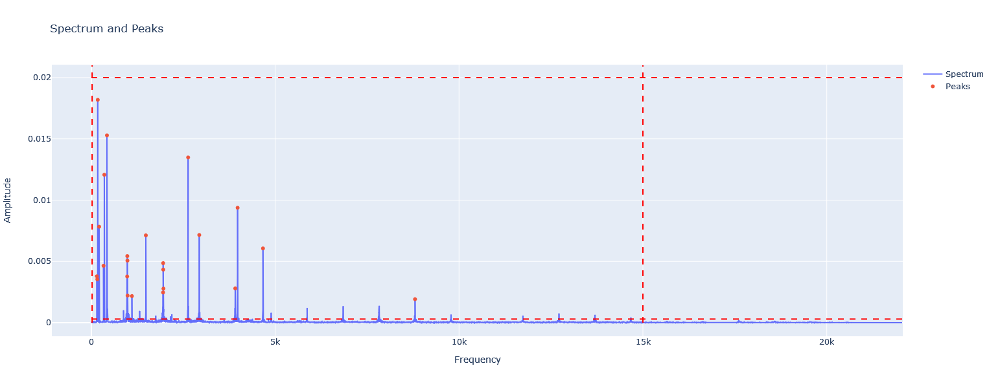

In [ ]:
from audiospylt.dft_analysis import analyze_signal

# Peak-picking parameters (keep within sensible bounds):
# - window_type: scipy window name
# - thresh_amp_low/high: peak height bounds in *linear FFT magnitude* units (0 < low < high)
# - thresh_freq_low/high: keep peaks within [low, high] Hz (high <= Nyquist or None)
# - prominence: (advanced) raw scipy prominence in same units as the spectrum amplitude
# - prominence_rel: (recommended) [0,1] prominence as fraction of max(spec)
# - width: (advanced) raw scipy width in FFT bins
# - width_hz: (recommended) width in Hz (converted to bins)
# - distance_hz: (optional) min spacing between peaks in Hz (helps avoid picking adjacent bins)
# - freq_axis_mode: 'linear' | 'log' | 'mel' | 'mixed'  (plot only)
# - freq_axis_mix: [0,1] only for 'mixed' (0=linear spacing, 1=log-like spacing)
# - mixed_log_floor_hz: >0 only for 'mixed' (plot only)
# - amp_axis_mode: 'linear' | 'log' | 'mixed' (plot only)
# - amp_axis_mix: [0,1] only for amp_axis_mode='mixed'
# - amp_log_floor: >0 floor used for log/mixed amplitude plotting (avoids log(0))
# - auto_plot_range: auto-zoom plot ranges based on freq/amp thresholds (+ padding)
# - freq_plot_pad_hz/freq_plot_pad_frac: padding around [thresh_freq_low, thresh_freq_high] (Hz or fraction of span)
# - amp_plot_pad/amp_plot_pad_frac: additive padding around [thresh_amp_low, thresh_amp_high] (linear/mixed)
# - amp_plot_pad_ratio: multiplicative padding for log amp axis
# - plot_width/plot_height: plot size (pixels) for waveform+window preview and spectrum plot
# - plot_title_source: which string to show in plot titles: 'filename' | 'source'
# - plot_title_mode: how to show it: 'full' | 'basename'
# - show_windowed_waveform: if True, show waveform after applying window_type, with the window curve overlaid in red (shown FIRST)
# - partial_tracking: if True, keep only peaks within +/- partial_bandwidth_hz of k*f0 (applies after initial peak filtering)
# - f0: fundamental frequency in Hz (required when partial_tracking=True)
# - partial_bandwidth_hz: bandwidth in Hz around each partial (k*f0)
# - plot_partials: if True, overlay partial center lines and +/- bandwidth bands on the spectrum
#
# Highlight / styling parameters (Plotly color strings):
# - spectrum_color: None (default) or a color (e.g. 'royalblue', '#1f77b4', 'rgba(31,119,180,1)')
# - peaks_color: None (default) or a color string
# - threshold_color: color for threshold lines (default: 'Red')
# - partials_color: color for partial center lines (default: 'rgba(0, 180, 0, 0.65)')
# - partials_band_fill: fill color for partial bands (default: 'rgba(0, 180, 0, 0.10)')
#
# Notes:
# - thresh_amp_* values are in *linear FFT magnitude* units (not dB).
# - For amp_axis_mode='mixed', y-axis tick labels are mapped back to raw amplitude units.

window_type = "hann"
thresh_amp_low = 0.0015
thresh_amp_high = 0.025
thresh_freq_low = 30
thresh_freq_high = 1250

# Prefer the intuitive variants:
prominence_rel = 0.005  # try 0.01..0.10
width_hz = 3        # e.g. 5.0..30.0 to prefer broader peaks
distance_hz = 5     # e.g. 5.0..30.0 to avoid adjacent-bin peaks

# Keep these as None unless you want raw scipy behavior:
prominence = None
width = None

# Plot axis scaling:
freq_axis_mode = "linear"
freq_axis_mix = 0.5
mixed_log_floor_hz = 1.0

amp_axis_mode = "linear"
amp_axis_mix = 0.5
amp_log_floor = 1e-12

# Auto-zoom plot ranges to your thresholds (+ padding):
auto_plot_range = True
freq_plot_pad_hz = None      # set e.g. 50 for +/-50 Hz padding
freq_plot_pad_frac = 0.05    # used when freq_plot_pad_hz is None
amp_plot_pad = None          # set e.g. 0.01 for +/-0.01 amplitude padding
amp_plot_pad_frac = 0.10     # used when amp_plot_pad is None
amp_plot_pad_ratio = 0.15    # only used when amp_axis_mode='log'

# Plot size / naming:
plot_width = 800
plot_height = None
plot_title_source = "source"   # "filename" | "source"
plot_title_mode = "basename"     # "basename" | "full"
show_windowed_waveform = True

# Partial tracking (after initial peak filtering):
partial_tracking = True
f0 = 263.0
partial_bandwidth_hz = 10.0
plot_partials = True

# Highlight colors (optional; keep None to use Plotly defaults):
spectrum_color = None
peaks_color = None
threshold_color = "Red"
partials_color = "rgba(0, 180, 0, 0.65)"
partials_band_fill = "rgba(0, 180, 0, 0.20)"

show_peaks = True
show_plot = True

plot_title_name = (
    audio_info["wav_source"] if plot_title_source == "source" else audio_info["wav_filename"]
)

peaks_df = analyze_signal(
    signal=cut_audio_data,
    sr=sample_rate,
    filename=plot_title_name,
    window_type=window_type,
    thresh_amp_low=thresh_amp_low,
    thresh_amp_high=thresh_amp_high,
    thresh_freq_low=thresh_freq_low,
    thresh_freq_high=thresh_freq_high,
    prominence=prominence,
    width=width,
    prominence_rel=prominence_rel,
    width_hz=width_hz,
    distance_hz=distance_hz,
    freq_axis_mode=freq_axis_mode,
    freq_axis_mix=freq_axis_mix,
    mixed_log_floor_hz=mixed_log_floor_hz,
    amp_axis_mode=amp_axis_mode,
    amp_axis_mix=amp_axis_mix,
    amp_log_floor=amp_log_floor,
    auto_plot_range=auto_plot_range,
    freq_plot_pad_hz=freq_plot_pad_hz,
    freq_plot_pad_frac=freq_plot_pad_frac,
    amp_plot_pad=amp_plot_pad,
    amp_plot_pad_frac=amp_plot_pad_frac,
    amp_plot_pad_ratio=amp_plot_pad_ratio,
    show_peaks=show_peaks,
    show_plot=show_plot,
    plot_width=plot_width,
    plot_height=plot_height,
    plot_title_name=plot_title_name,
    plot_title_mode=plot_title_mode,
    show_windowed_waveform=show_windowed_waveform,
    partial_tracking=partial_tracking,
    f0=f0,
    partial_bandwidth_hz=partial_bandwidth_hz,
    plot_partials=plot_partials,
    spectrum_color=spectrum_color,
    peaks_color=peaks_color,
    threshold_color=threshold_color,
    partials_color=partials_color,
    partials_band_fill=partials_band_fill,
)

5. Now we can save the df with results of our analysis. It's advisable to add a certain ending e.g "_single" or set a dedicated directory if you are saving your values to clearly distinguish between saved single dft frames, and dfs containing information with multiple frames.

In [5]:
import os
from datetime import datetime

# Define the path for the /tsv subfolder
output_directory = '../tsv'

# Check if the directory exists; if not, create it
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Define the filename path to save inside the /tsv subfolder
filename = os.path.join(output_directory, 'bayle_single.tsv')

try:
    peaks_df.to_csv(filename, sep='\t', index=False)
    print(f"Data saved successfully to {os.path.abspath(filename)} at {datetime.now()}.")
except:
    print("Error: data could not be saved.")


Data saved successfully to C:\Users\egorp\Nextcloud\code\audiospylt_beta\tsv\bayle_single.tsv at 2024-03-02 11:11:59.678094.


6. We can also plot the saved data in 2D.

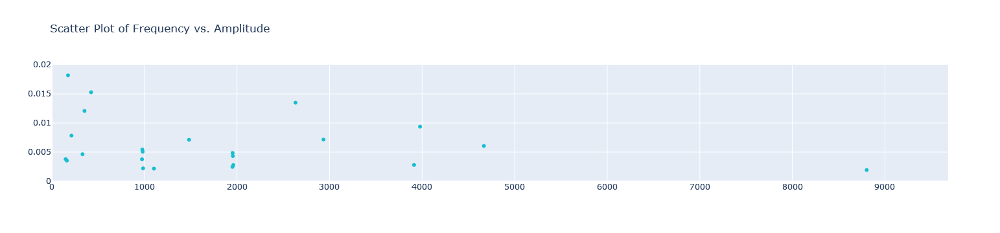

In [17]:
from py_scripts.multiplotter import plot_scatter

plot_scatter(dfs=[peaks_df], mode='markers')

7. Alternatively, display the data in symbolic form. Set the desired pitch resolution as 'half_tone', 'quarter_tone', or 'half_tone_deviation', and choose the option to include natural accidentals.

In [19]:
from py_scripts.mei import process_and_visualize

process_and_visualize(peaks_df, resolution='half_tone_deviation', include_natural_accidentals=False, save_mei=False, save_path='my_output.mei', display_df=True)

,Frequency (Hz),MIDI Value,MIDI Cent Deviation,Pitch Name,Note,Octave,Alter
0,149.090909,50,+26,D3,D,3,n
1,161.818182,52,-32,E3,E,3,n
2,174.545455,53,-1,F3,F,3,n
3,211.818182,56,+34,G#3,G,3,s
4,330.909091,64,+7,E4,E,4,n
5,352.727273,65,+17,F4,F,4,n
6,423.636364,68,+34,G#4,G,4,s
7,973.636364,83,-25,B5,B,5,n
8,977.272727,83,-18,B5,B,5,n
9,980.909091,83,-12,B5,B,5,n


8. Now, we duplicate the DFT frame we calculated earlier to produce a 'frozen' sound, which aids in better analyzing the harmonics. With the 'wave_stop_value', we can define the length of the frozen sound. The 'override_amp_value' can be used to set the amplitude value uniformly for all harmonics. 'scale_amp_value' scales all amplitude values so that the maximum value equals 1.

In [20]:
import numpy as np

# duplicate the columns into a new dataframe
peaks_df.replace([np.inf, -np.inf], np.nan, inplace=True)

double_df = pd.DataFrame({
    "freq_data1": peaks_df["Frequency (Hz)"],
    "amp_data1": peaks_df["Amplitude"],
    "freq_data2": peaks_df["Frequency (Hz)"],
    "amp_data2": peaks_df["Amplitude"]
})

def process_df(input_df, freq_start_col, amp_start_col, freq_stop_col, amp_stop_col, wave_stop_value, override_amp_value=None, scale_amp_value=True):
    # Scaling amplitude if required
    if scale_amp_value:
        amp_start_scaled = input_df[amp_start_col] / input_df[amp_start_col].max()
        amp_stop_max = input_df[amp_stop_col] / input_df[amp_stop_col].max()
    else:
        amp_start_scaled = input_df[amp_start_col]
        amp_stop_max = input_df[amp_stop_col]
    
    # Overriding amplitude values if required
    if override_amp_value is not None:
        amp_min = [override_amp_value] * len(input_df)
        amp_max = [override_amp_value] * len(input_df)
    else:
        amp_min = amp_start_scaled
        amp_max = amp_stop_max

    new_data = {
        "freq_start": input_df[freq_start_col],
        "freq_stop": input_df[freq_stop_col],
        "time_start": [0.0] * len(input_df),
        "time_stop": [wave_stop_value] * len(input_df),
        "amp_min": amp_min,
        "amp_max": amp_max
    }
    
    return pd.DataFrame(new_data)

wave_stop_value = 15.0
override_amp_value = None
scale_amp_value = True

new_df = process_df(double_df, 'freq_data1', 'amp_data1', 'freq_data2', 'amp_data2', wave_stop_value, override_amp_value, scale_amp_value)
display(new_df)

,freq_start,freq_stop,time_start,time_stop,amp_min,amp_max
0,149.090909,149.090909,0.0,15.0,0.208361,0.208361
1,161.818182,161.818182,0.0,15.0,0.194856,0.194856
2,174.545455,174.545455,0.0,15.0,1.000000,1.000000
3,211.818182,211.818182,0.0,15.0,0.430820,0.430820
4,330.909091,330.909091,0.0,15.0,0.255471,0.255471
5,352.727273,352.727273,0.0,15.0,0.663852,0.663852
6,423.636364,423.636364,0.0,15.0,0.840502,0.840502
7,973.636364,973.636364,0.0,15.0,0.207506,0.207506
8,977.272727,977.272727,0.0,15.0,0.298936,0.298936
9,980.909091,980.909091,0.0,15.0,0.278574,0.278574


9. Now, we need to determine the optimal sampling rate based on the highest frequency present in our DataFrame.

In [21]:
def estimate_sampling_frequency_and_time_vector_updated(new_df):
    # Estimating the sampling frequency based on the highest frequency in the df
    highest_frequency = max(new_df['freq_start'].max(), new_df['freq_stop'].max())
    sampling_frequency = 2 * highest_frequency
    
    # Use the highest value from the time_stop column as wave_stop_value
    wave_stop_value = new_df['time_stop'].max()
    
    # Calculate the sampling interval
    delta_t = 1 / sampling_frequency
    
    return sampling_frequency, delta_t, wave_stop_value

# Using the updated function to estimate the sampling frequency and time vector
sampling_frequency_updated, delta_t_updated, duration = estimate_sampling_frequency_and_time_vector_updated(new_df)

# Printing the results
print(f"Estimated Optimal Sampling Frequency: {sampling_frequency_updated:.3f} Hz")
print(f"Sampling Interval (Delta t): {delta_t_updated:.6f} seconds")
print(f"Duration (highest value from time_stop column): {duration:.3f} seconds")


Estimated Optimal Sampling Frequency: 17605.455 Hz
Sampling Interval (Delta t): 0.000057 seconds
Duration (highest value from time_stop column): 15.000 seconds


10. Let's render the audio using the suggested delta t value or purpusefully pick another one at your own risk.

In [22]:
from py_scripts.plot_wave import plot_waves

# define the time vector (from 0 to n seconds, with a step of k seconds)
k=0.000055

y_combined = plot_waves(new_df, k, disable_freq_plot=True, disable_amp_plot=True, disable_combined_plot=True, disable_wave_plot=True)

11. Then, we can save the audio or listen to it.

In [23]:
import numpy as np
from py_scripts.generate_wave_file import generate_wave_file
from IPython.display import Audio, display

player = True
save_audio = False

y_combined_no_nan = np.nan_to_num(y_combined)

fs_initial = 1 / k  # The initial sampling rate is the inverse of the time step (k)

def display_audio_from_array(audio_data, sample_rate):
    """Display the audio player using audio data array."""
    display(Audio(audio_data, rate=sample_rate))

# Generate the wave or audio data
if save_audio:
    filename = generate_wave_file(y_combined_no_nan, fs_initial, fs_target_name='44.1kHz', bit_rate=24, save_to_file=True)
    if player:
        display(Audio(filename=filename))
else:
    audio_data, fs_target = generate_wave_file(y_combined_no_nan, fs_initial, fs_target_name='44.1kHz', bit_rate=24, save_to_file=False)
    if player:
        display_audio_from_array(audio_data, fs_target)